In [1]:
from functools import partial
from collections.abc import Iterable

import numpy as np
import scipy.stats

import matplotlib.pyplot as plt

from matplotlib.animation import ArtistAnimation
from IPython.display import HTML

In [2]:
title = "# Sampling from distributions"
# Print title and setup TeX defs for both KaTeX and MathJax
import bayesian_stats_course_tools
bayesian_stats_course_tools.misc.display_markdown_and_setup_tex(title)

import matplotlib.style
matplotlib.style.use("bayesian_stats_course_tools.light")

# Sampling from distributions

<!-- Define LaTeX macros -->
$\def\E{\operatorname{E}}$
$\def\Var{\operatorname{Var}}$
$\def\Cov{\operatorname{Cov}}$
$\def\dd{\mathrm{d}}$
$\def\ee{\mathrm{e}}$
$\def\Norm{\mathcal{N}}$
$\def\Uniform{\mathcal{U}}$

<!-- MathJax needs them to be defined again for the non-inline environment -->
$$\def\E{\operatorname{E}}$$
$$\def\Var{\operatorname{Var}}$$
$$\def\Cov{\operatorname{Cov}}$$
$$\def\dd{\mathrm{d}}$$
$$\def\ee{\mathrm{e}}$$
$$\def\Norm{\mathcal{N}}$$
$$\def\Uniform{\mathcal{U}}$$

In Bayesian data analyses we often need to evaluate integrals over probability distributions. Such as
- means and variances
- marginal distributions

Computing integrals in more than 2-3 dimensions becomes very difficult, and realistic models can have dozens of parameters (i.e. dimensions to integrate over).



For example, if we use the trapezoidal rule to compute an integral in one dimension, we might need 50 evaluations of the integrand to get a good estimate.
For just 6 dimensions, we would already need $50^6\approx 1.6\cdot10^{10}$ evaluations!

This is made worse by the curse of dimensionality: as the number of dimension increases, the volume of high probability gets smaller and smaller.


The good news is that if we can draw samples from our distributions, we can use them to compute the integrals.

If we want to evaluate the expectation of $f(x)$ with respect to the distribution $p$:
$$
    \Phi = \E[f(\vec x)] = \int f(\vec x)p(\vec x)\dd x^n
$$

If we have $N$ samples $\vec x_i\sim p$, we can approximate $\Phi$ as
$$
    \hat\Phi = \frac{1}{N}\sum_i f(\vec x_i)
$$

If we have $N$ samples $x_{ij}$ from a $d$-dimensional distribution ($i = 1,\dots,N$, $j=1,\dots,d$), we get samples from the marginal distributions by dropping the columns of the matrix $x_{ij}$ that correspond the dimensions we want to marginalise over.



Luckily the rise of Monte Carlo algorithms and powerful computers have made this possible.

We first have a look at rejection sampling. Conceptionally easy but very inefficient in high dimensions.

Then we go through three common sampling approaches:
- Metropolis-Hastings
- Slice sampling
- Nested sampling

Hamilton Monte Carlo and variational inference we leave until later.

The standard reference for this topic is chapter 29 in Information Theory, Inference, and Learning Algorithms.


Our target distribution we want to sample from:

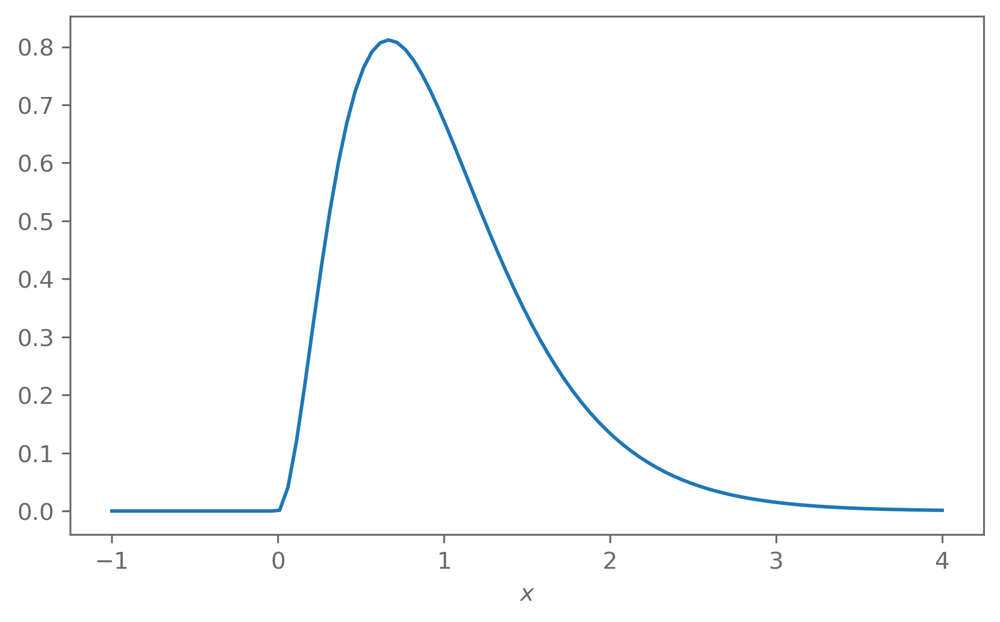

In [8]:
target_distr = scipy.stats.gamma(a=3, scale=1/3)

grid = np.linspace(-1, 4, 100)
plt.plot(grid, target_distr.pdf(grid))
plt.xlabel("$x$");

## Rejection sampling

The basic idea is to generate points $(x, y)$ that sample the area under $p(x)$ uniformly.

While we cannot sample from $p(x)$ directly, we assume we can find a distribution $q(x)$ that we can sample from and for which
$$
M q(x) > p(x)\ \forall x
$$
for some constant $M$.

We then sample $x_i$ from $q(x)$ and $u_i|x_i\sim\Uniform(0, M q(x_i))$. 
The points $(x_i, u_i)$ sample the area under the curve $M q(x)$ uniformly.

From this sample of points, we remove those where $u_i > p(x_i)$, which leaves us with points that uniformly sample the area under $p(x)$ and thus $x_i\sim p$.

In [5]:
# We use a Gaussian as our proposal distribution q and set M to 3
proposal_distr = scipy.stats.norm(loc=0.5, scale=1.3)
M = 3

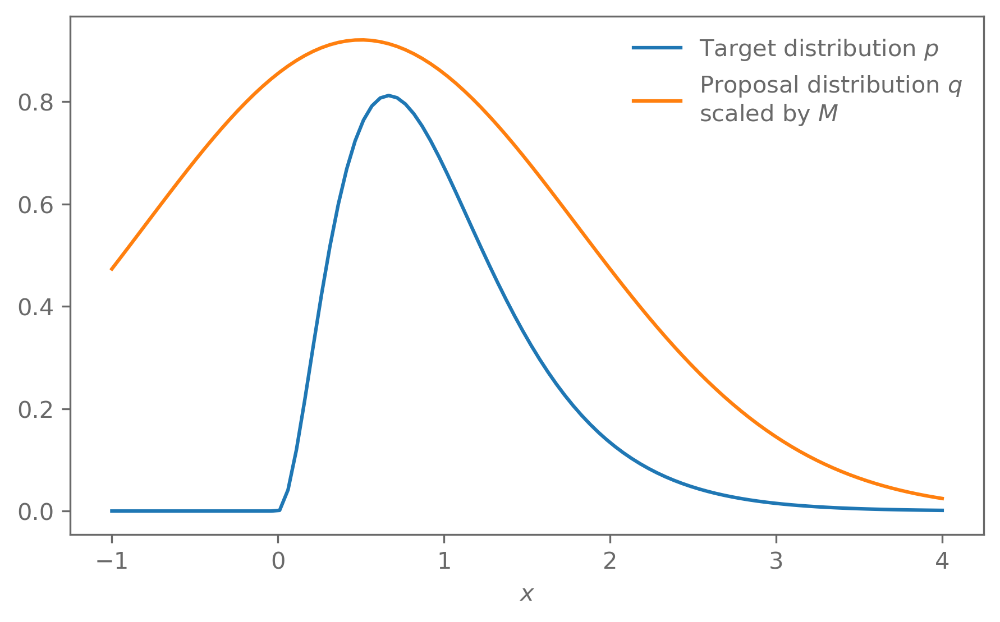

In [6]:
plt.plot(grid, target_distr.pdf(grid), label="Target distribution $p$")
plt.plot(grid, M*proposal_distr.pdf(grid), label="Proposal distribution $q$\nscaled by $M$")
plt.xlabel("$x$")
plt.legend(frameon=False);

In [10]:
def sample_with_viz(n):
    samples_generated = 0
    while samples_generated < n:
        x = proposal_distr.rvs(size=1)
        u = np.random.uniform(size=1)

        f = target_distr.pdf(x)
        g = proposal_distr.pdf(x)

        accept = u < f/(M*g)
        samples_generated += 1
        yield accept, x, u, f, M*g

wide_grid = np.linspace(-3, 4, 100)

hist_bins = np.linspace(wide_grid[0], wide_grid[-1], 20)
hist_bin_width = hist_bins[1] - hist_bins[0]

fig, ax = plt.subplots(1, 1, facecolor="none")
fig.patch.set_alpha(0.0)

ax.plot(wide_grid, target_distr.pdf(wide_grid), color="C0")
ax.plot(wide_grid, M*proposal_distr.pdf(wide_grid), color="grey")
ax.set_xlabel("$x$")

_, _, hist = ax.hist(
    x=np.array([]), bins=hist_bins,
    density=False, alpha=0.5, color="C0"
)

samples = []
artists = []
accepted_points_artists = []
rejected_points_artists = []

generated_objects = list(sample_with_viz(80))
n_accepted = sum(accept for accept, _, _, _, _ in generated_objects)

for i, (accept, x, u, f, Mg) in enumerate(generated_objects):
    if i < 4:
        vline = ax.vlines(x=x, ymin=0, ymax=Mg, color="grey")
        artists.append([vline] + accepted_points_artists + rejected_points_artists + list(hist.patches))

        point = ax.plot(x, Mg*u, marker="o", color="black")
        artists.append([vline] + point + accepted_points_artists + rejected_points_artists + list(hist.patches))

    if accept:
        samples.append(x)
        point = ax.plot(x, Mg*u, marker="o", color="C0")
        accepted_points_artists += point
    else:
        point = ax.plot(x, Mg*u, marker="o", color="grey")
        rejected_points_artists += point
    _, _, hist = ax.hist(
        x=np.array(samples), bins=hist_bins,
        weights=1/n_accepted/hist_bin_width*np.ones(len(samples)),
        density=False, alpha=0.5, color="C0"
    )

    artists.append(accepted_points_artists + rejected_points_artists + list(hist.patches))


rejection_sampling_ani = ArtistAnimation(fig, artists=artists, blit=True)
# rejection_sampling_ani.save("plots/rejection_sampling.html", writer="html")
plt.close()
HTML(rejection_sampling_ani.to_jshtml())

In [7]:
def sample(n):
    samples_generated = 0
    rejections = 0
    while samples_generated < n:
        x = proposal_distr.rvs(size=1)
        u = np.random.uniform(size=1)

        f = target_distr.pdf(x)
        g = proposal_distr.pdf(x)

        if u < f/(M*g):
            samples_generated += 1
            yield x
        else:
            rejections += 1

    acceptance_rate = samples_generated/(samples_generated+rejections)
    print(f"Acceptance rate: {acceptance_rate}")

Acceptance rate: 0.3359086328518643


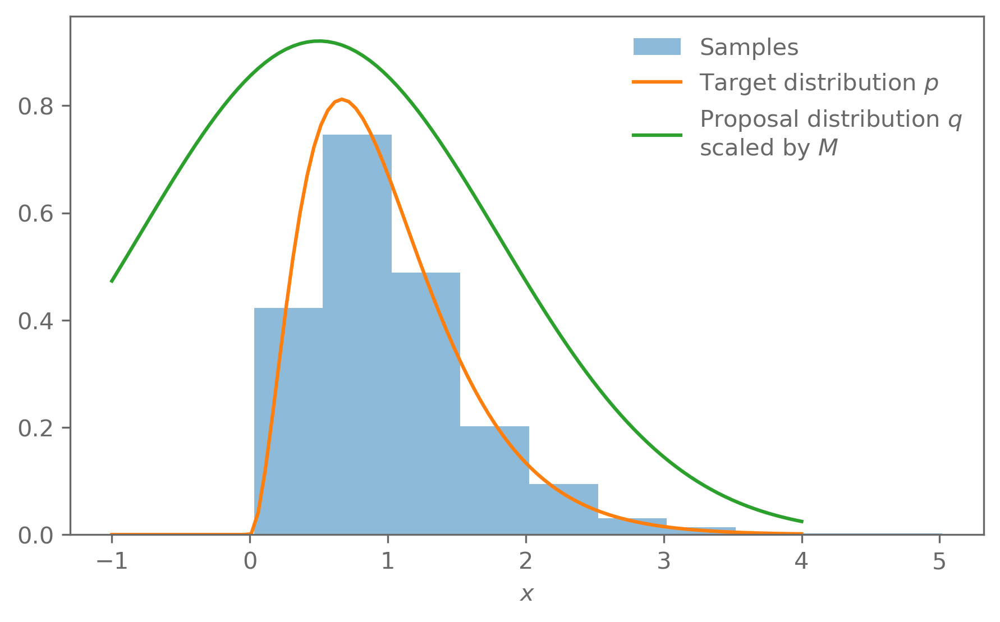

In [8]:
samples = []
for x in sample(1000):
    samples.append(x)

plt.hist(np.array(samples), density=True, alpha=0.5, label="Samples")
plt.plot(grid, target_distr.pdf(grid), label="Target distribution $p$")
plt.plot(grid, M*proposal_distr.pdf(grid), label="Proposal distribution $q$\nscaled by $M$")
plt.xlabel("$x$")
plt.legend(frameon=False);

### Challenges with rejection sampling

Finding a good proposal and $M$.

Curse of dimensionality: assume we want to sample uniformly from a disc of radius 1 and use uniform distribution on the square around the disc as the proposal distribution. 

The acceptance rate in this case is $\frac{\text{area of disc}}{\text{area of square}} = \frac{\pi}{2^2} \approx 0.79$. Pretty good!

In $d$ dimensions, the acceptance rate is 
$$
    \frac{\text{volume of unit ball}}{\text{volume of hypercube}} = \frac{\pi^\frac{d}{2}}{\Gamma(\frac{d}{2}+1)}\frac{1}{2^d}
$$


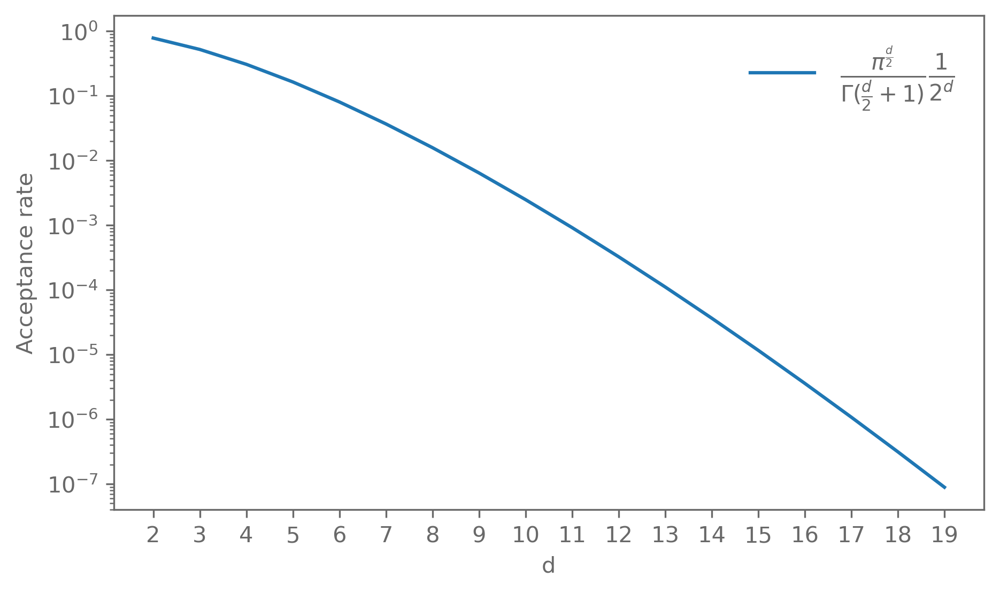

In [9]:
from scipy.special import gamma as Gamma
n = np.arange(2, 20)
acceptance_rate = np.pi**(n/2)/Gamma(n/2+1)/2**n

fig, ax = plt.subplots()
ax.semilogy(n, acceptance_rate, label=r"$\frac{\pi^\frac{d}{2}}{\Gamma(\frac{d}{2}+1)}\frac{1}{2^d}$")
ax.set_xlabel("d")
ax.set_ylabel("Acceptance rate")
ax.set_xticks(n)
ax.legend(frameon=False, fontsize="x-large")
fig.dpi = 300

### Exercise

Implement your own rejection sampling routine and test it with different target and proposal distributions.

## Markov chains Monte Carlo

Many of the Monte Carlo methods in use are built around the concept of Markov chains. 
Using such Markov chains to sample from a distribution is called Markov chain Monte Carlo (MCMC). 



A Markov chain is a sequence of RVs $X_0,\dots,X_t$ where the distribution of $X_t$ only depends on $X_{t-1}$. 

$$
\Pr(X_t = x_t | X_0=x_0,\dots X_{t-1}= x_{t-1}) = \Pr(X_t = x_t | X_{t-1}= x_{t-1})
$$

Knowing the states $X_0,\dots,X_{t-2}$ in addition to $X_{t-1}$ does not provide more information.

The probability to transition from state $y$ to $x$ in a Markov chain is given by the transition probability $T(x | y) = \Pr(X_t=x | X_{t-1}=y)$.

We want the Markov chain to sample our target distribution $p$. 
If the transition probability $T$ has the property
$$
T(x|y)p(y) = T(y | x)p(x) 
$$
it is said to respect detailed balance.



If $T$ satisfies detailed balance, then $p$ is a stationary distribution of the Markov chain:
$$
    p(x) = \sum_{y} T(x | y)p(y)
$$
If we start on $p$ and transition with $T$, then we end up with the same distribution $p$. This is what we want: as the chain transitions from one state to the next, the states should all be distributed according to $p$.

To show this
\begin{align}
    \sum_y T(x|y)p(y) &= \sum_y T(y|x)p(x) \quad \text{(detailed balance)}\\
    &= p(x) \sum_y T(y|x) \\
    & = p(x)
\end{align}

This is the distribution we care about in MCMC: we can sample from $p(x)$ by creating a Markov chain using the transition probabilities $T(x|y)$, provided they satisfy detailed balance. 
We skipped over a lot of mathematical details and conditions here but this is the basic idea on how to sample from some distribution $p(x)$.

### Metropolis-Hastings

Metropolis-Hastings is a classical MCMC algorithm. It works as follows:
Given a distribution $p(x)$ we want to sample from, a proposal distribution $q(x|y)$, and a starting point $x_{t=0}$
1. Sample a proposal $x'$ from $q$: $x'\sim q(\cdot|x_t)$
2. Compute the quantity 
$$
    a = \frac{p(x')q(x_t|x')}{p(x_t)q(x'|x_t)}
$$
3. If $a\geq 1$, accept $x'$. If $a < 1$, accept $x'$ with probability $a$:
    - If accepted: $x_{t+1} = x'$
    - If rejected: $x_{t+1} = x_t$

In the case where $q$ is symmetric ($q(x|y)=q(y|x)$), $a = \frac{p(x')}{p(x_t)}$: if the proposed point has a higher probability than the previous point, accept it. Else, accept it with probability $a$.

In [7]:
# We use a normal distribution with variance 1 as the proposal
proposal_distr = partial(scipy.stats.norm, scale=1)

def sample_transition(x0):
    return proposal_distr(loc=x0).rvs(size=1)

def transition_prob(x, y):
    # Q(x; y)
    return proposal_distr(loc=y).pdf(x)

In [15]:
def sample_for_viz(n, x0):
    x0 = np.array([x0])
    for _ in range(n):
        x1 = sample_transition(x0)
        p0 = target_distr.pdf(x0)
        p1 = target_distr.pdf(x1)

        q01 = transition_prob(x0, x1)
        q10 = transition_prob(x1, x0)

        a = p1/p0 * q01/q10
        u = np.random.uniform(size=1)

        accept = a > u
        x0_tmp, x1_tmp = x0, x1
        if accept:
            x0 = x1
        yield accept, x0, x0_tmp, x1_tmp, p0, p1, u


fig, ax = plt.subplots(1, 1)
fig.patch.set_alpha(0.0)

ax.plot(grid, target_distr.pdf(grid), color="C0")

_, _, hist = ax.hist(
    x=np.array([]), bins=hist_bins,
    density=False, alpha=0.5, color="C0"
)

samples = []
artists = []
accepted_points_artists = []

n_sample = 100

for i, (accept, x, x0, x1, p0, p1, u) in enumerate(sample_for_viz(n_sample, x0=2.0)):
    if i < 4:
        x0_point = ax.plot(x0, p0, marker="o", color="k")
        x0_label = ax.text(x=x0+0.02, y=p0+0.02, s="$x_0$")

        artists.append(x0_point + [x0_label] + accepted_points_artists + list(hist.patches))

        x0_grid = np.linspace(x0-3, x0+3, 100)
        proposal_plot = ax.plot(x0_grid, transition_prob(x0_grid, x0), color="grey")

        artists.append(x0_point + [x0_label] + proposal_plot + accepted_points_artists + list(hist.patches))

        x1_point = ax.plot(x1, p1, marker="o", color="C4")
        x1_label = ax.text(x=x1+0.02, y=p1+0.02, s="$x_1$")

        artists.append(x0_point + [x0_label] + proposal_plot + x1_point + [x1_label] + accepted_points_artists + list(hist.patches))

        hlines = [ax.hlines(p0, xmin=x0, xmax=x1, color="k")]
        hlines.append(ax.hlines(p1, xmin=x0, xmax=x1, color="C4"))
        artists.append(x0_point + [x0_label] + proposal_plot + x1_point + [x1_label] + hlines + accepted_points_artists + list(hist.patches))

        if p0 > p1:
            hlines.append(ax.hlines(p0*u, xmin=x0, xmax=x1, ls="--", color="grey"))
            artists.append(x0_point + [x0_label] + proposal_plot + x1_point + [x1_label] + hlines + accepted_points_artists + list(hist.patches))

    samples.append(x)
    _, _, hist = ax.hist(
        x=np.array(samples), bins=hist_bins,
        weights=1/n_sample/hist_bin_width*np.ones(len(samples)),
        density=False, alpha=0.5, color="C0"
    )

    if accept:
        new_point = ax.plot(x1, p1, marker="o", color="C0")
    else:
        new_point = ax.plot(x0, p0, marker="o", color="C0")
    accepted_points_artists += new_point

    artists.append(list(hist.patches) + accepted_points_artists)

mh_animation = ArtistAnimation(fig, artists=artists)
plt.close()
HTML(mh_animation.to_jshtml())

In [4]:
def sample_metropolis_hastings(n, x0, target_distr,
                               sample_transition, transition_prob):
    x0 = np.atleast_1d(x0)
    for i in range(n):
        # Sample proposal
        x1 = sample_transition(x0)
        # Compute probabilities of the old and proposed states
        p0 = target_distr.pdf(x0)
        p1 = target_distr.pdf(x1)

        # Compute the transition probabilities
        q01 = transition_prob(x0, x1)
        q10 = transition_prob(x1, x0)

        a = p1/p0 * q01/q10

        u = np.random.uniform(size=1)
        if a >= u:
            # accept, proposed state becomes new state
            x0 = x1
            yield x1
        else:
            # reject, stay with current state
            yield x0

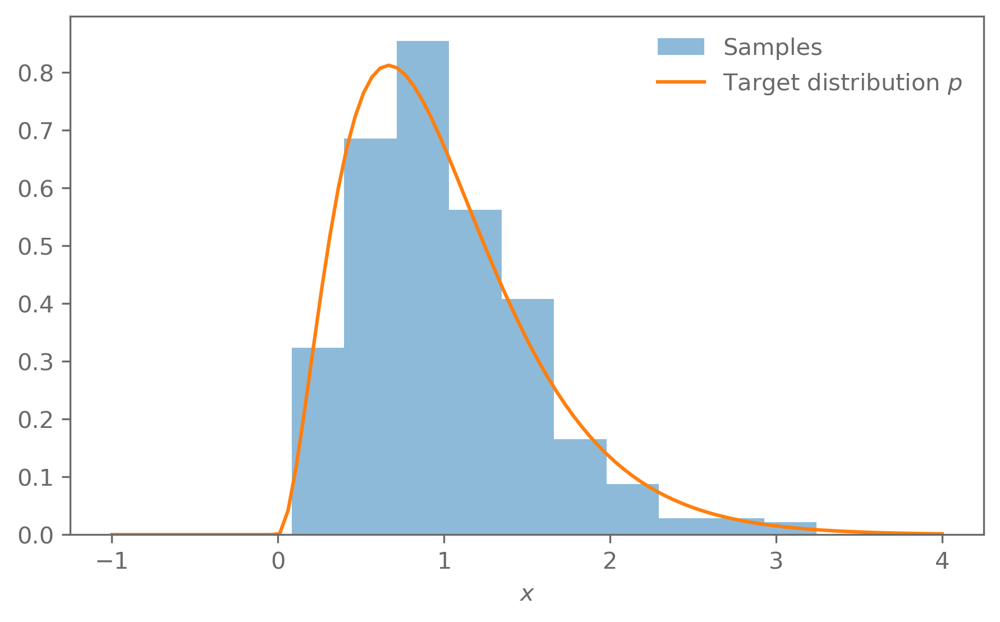

In [8]:
samples = []
for x in sample_metropolis_hastings(
        1000, x0=3, 
        target_distr=target_distr,
        sample_transition=sample_transition,
        transition_prob=transition_prob):
    samples.append(x)

plt.hist(np.array(samples)[100:], density=True, alpha=0.5, label="Samples")
plt.plot(grid, target_distr.pdf(grid), label="Target distribution $p$")
plt.xlabel("$x$")
plt.legend(frameon=False);

### Challenges with Metropolis-Hastings

Metropolis-Hastings still requires a well-tuned proposal distribution to work well.

If the proposal is too broad, the acceptance rate goes down, because proposed points are likely in a low-probability part of the target distribution.

If the proposal is too narrow, Metropolis-Hasting becomes a random walk, which takes a long time to explore the full volume of the target distribution.

Having the proposal be as close to the target distribution is optimal but for that you need to know the target distribution first!

### Exercise

- Implement Metropolis-Hastings for $n$ dimensional distributions
    - Sample from a 2D Gaussian (code on the next slide)
    - Plot the samples in the chain. How do the samples depend on the starting position?
- Show that Metropolis-Hastings satisfies detailed balance
    - Hint: $T(x|y) = q(x|y)\min(1, a)$

In [25]:
# Define variances and correlation
sigma_x = 1
sigma_y = 2
rho = 0.7

# Define mean and covariance
mean = np.array([1, 0.5])
cov = np.array([[sigma_x**2, sigma_x*sigma_y*rho],
                [sigma_x*sigma_y*rho, sigma_y**2]])

# Create distribution object
bivariate_normal = scipy.stats.multivariate_normal(mean=mean, cov=cov)

# Sample 1000 points. Do this with your MCMC implementation instead!
samples = bivariate_normal.rvs(size=1000)

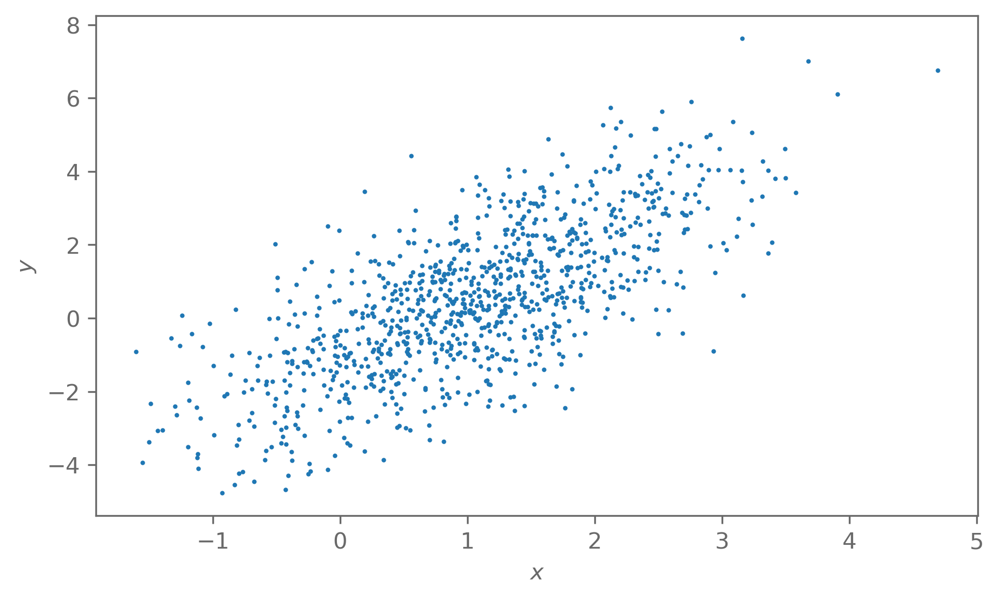

In [26]:
plt.scatter(*samples.T, s=1)
plt.ylabel("$y$")
plt.xlabel("$x$");

## Practical considerations for MCMC methods

The implementations shown here are the most barebones and simplest version of these methods. 
Implementing them yourselves is important to understand how these methods work and what some of the pitfalls are.

In a real-world application, with many parameters and complicated likelihoods, you probably want to use established implementations that use more sophisticated methods and are well-tested, instead of your own implementation. 

Examples are emcee, zeus, and dynesty.


Because the state of a Markov chains depends on the previous state, the samples generated in MCMC are not independent. This has a few implications:
- The chain will take some time to move from the starting position to the bulk of the target distribution. This burn-in phase needs to be removed from the chain.
- If we use $n$ samples from the chain to estimate a quantity of the distribution, for example the mean, then the variance of this estimate will not decrease as $\frac{1}{n}$, because the samples are correlated. 

This is demonstrated in the solutions to the Metropolis-Hasting exercise. 

A good description of the process can be found on the emcee documentation: https://emcee.readthedocs.io/en/stable/tutorials/autocorr/
